# Adaptive Subtraction

In this notebook we apply adaptive subtraction to correct an initial estimate of the multiples in seismic data. Adaptive may be described by the inverse problem

$$
    x_{\star} = arg\min_x \Vert Mx - d\Vert_p + \lambda\Vert x\Vert_q \ \ \ (1), 
$$

where $M$ denotes convolution with an initial estimate of the multiples, $d$ is the total data including primaries and multiples, $x_{\star}$ is the estimated multiples after adaptive subtraction and $\Vert\cdot\Vert_p$ denotes a norm. Guitton et al. have shown that the $L_1$-norm $\Vert\cdot\Vert_1$ on the data is more appropriate than the standard $L_2$-norm $\Vert\cdot\Vert_2^2$-norm for adaptive subtraction. One drawback is that minimizing the $L_1$-norm is non-trivial due to the non-smoothness of the $L_1$-norm, leaving standard gradient-based optimization methods useless. We propose a modified version of the **Alternating Direction Method of Multipliers (ADMM)**, where a splitting is done by $y_k = Mx_k - d$, converting it into a constrained problem, which can be solved with the Augmented Lagrangian. Next, the $L_1$-$L_1$ regularized problem is solved via the following iterations:

\begin{eqnarray*}
x_{k+1} & = & \text{FISTA}\left(M, d + y_k - z_k, \frac{\lambda}{\rho}, x_0=x_k, \text{niter=niter}\right) \\
y_{k+1} & = & \text{soft_thresh}_{1/\rho}\left(Mx_{k+1} - d + z_k\right) \\
z_{k+1} & = & z_k + Mx_{k+1} - y_{k+1} - d
\end{eqnarray*}

First, we load the necessary libraries.

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import time
import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import matplotlib.pyplot as plt
import segyio
import pylops

from pylops.optimization.solver import lsqr
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

from adasubtraction.ADMM import ADMM
from adasubtraction.read_gathers import read_gathers
from adasubtraction.adasubtraction import adasubtraction
from adasubtraction.adasubtraction_mult import adasubtraction_mult
from adasubtraction.adasubtraction_joint import adasubtraction_joint
from adasubtraction.adasubtraction_parallel import adasubtraction_parallel
from adasubtraction.adasubtraction_qc import adasubtraction_qc 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Example from Guitton et al.

First we create the data and the multiples resembling those from the paper.

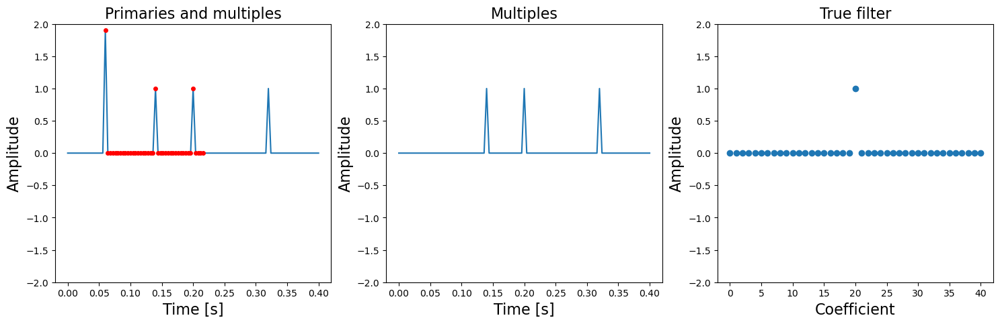

In [78]:
nt = 101
nfilt = 41
t = np.linspace(0, 0.4, nt)
data = np.zeros(nt)
data[np.argwhere(t == 0.06)] = 1.9
data[np.argwhere(t == 0.14)] = 1
data[np.argwhere(t == 0.20)] = 1
data[np.argwhere(t == 0.32)] = 1
multiples = data.copy()
multiples[np.argwhere(t == 0.06)] = 0
idx = np.argwhere(t == 0.14)[0][0]
mark = [i for i in range(idx-nfilt//2, idx+nfilt//2)]
filt_true = np.zeros(nfilt)
filt_true[nfilt//2] = 1
# plt.plot(vals,poly,markevery=mark, ls="", marker="o", label="points")

# Plot the data and the multiples
fig, axs = plt.subplots(1, 3, figsize=(18, 5))
axs[0].plot(t, data, markevery=mark, marker="o", label="points", ms=4, markerfacecolor='r', markeredgecolor='r')
# axs[0].plot(t, data, '')
axs[0].set_ylim(-2,2);
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel('Time [s]', fontsize=16);
axs[0].set_title('Primaries and multiples', fontsize=16)
axs[1].plot(t, multiples)
axs[1].set_ylim(-2,2);
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[1].set_xlabel('Time [s]', fontsize=16);
axs[1].set_title('Multiples', fontsize=16);
axs[2].plot(filt_true, 'o')
axs[2].set_ylim(-2,2);
axs[2].set_ylabel('Amplitude', fontsize=16)
axs[2].set_title('True filter', fontsize=16);
axs[2].set_xlabel('Coefficient', fontsize=16);

Now we make the convolutional operator. We have three multiples (spikes), therefore we will observe three diagonals in the convolutional matrix.

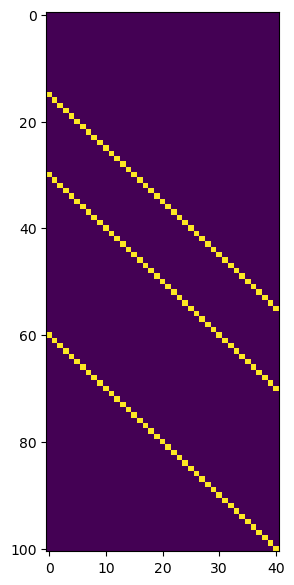

In [79]:
C = pylops.utils.signalprocessing.convmtx(multiples, nfilt)
C = C[nfilt//2:-(nfilt//2)]                 # trim to match size of data 
Cop = pylops.basicoperators.MatrixMult(C)   # convert to pylops Linear Operator

fig, axs = plt.subplots(1, 1, figsize=(3,7))
axs.imshow(C, aspect='auto');

Now we try to reconstruct the primaries and multiples via adaptive subtraction using the $L_2$-norm vi Least Squares. For this simple example, $\lambda = 0$, meaning there is no regularization.

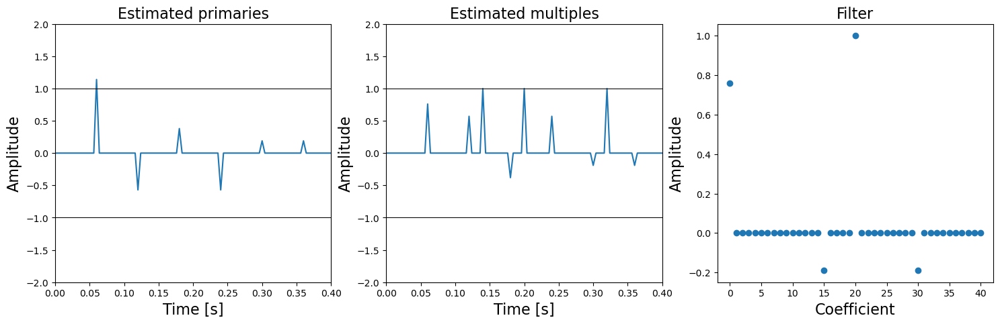

In [71]:
filt = lsqr(Cop, data, x0=np.zeros(nfilt), niter=25)[0]
multiple_est = np.dot(C, filt)
primary_est = data - multiple_est

# Plot the estimated primary and the estimated multiples after adaptive subtraction
fig, axs = plt.subplots(1, 3, figsize=(18, 5))
axs[0].plot(t, primary_est)
axs[0].set_ylim(-2,2);
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel('Time [s]', fontsize=16);
axs[0].set_title('Estimated primaries', fontsize=16)
axs[0].set_xlim(0, 0.4)
axs[0].axhline(y=1, color='k', linewidth=0.75)
axs[0].axhline(y=-1, color='k', linewidth=0.75)
axs[1].plot(t, multiple_est)
axs[1].axhline(y=1, color='k', linewidth=0.75)
axs[1].axhline(y=-1, color='k', linewidth=0.75)
axs[1].set_ylim(-2,2);
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[1].set_xlabel('Time [s]', fontsize=16);
axs[1].set_title('Estimated multiples', fontsize=16);
axs[1].set_xlim(0, 0.4);
axs[2].plot(filt,'o')
axs[2].set_ylabel('Amplitude', fontsize=16)
axs[2].set_title('Filter', fontsize=16);
axs[2].set_xlabel('Coefficient', fontsize=16);

Since the $L_2$-norm mimimizes the energy (primaries), the data misfit is as low as possible. However, Guitton et al. argue that for adaptive subtraction this is the wrong criterion. Instead, the $L_1$-norm is more appropriate, which we will now use to get the correct multiples and primaries.

Error is 0.00000
Residual is 1.90000


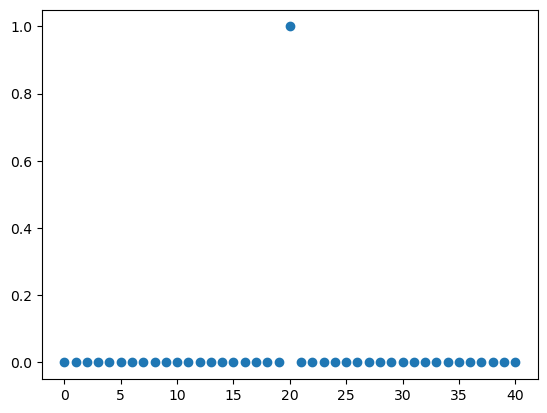

In [238]:
# Create filter with the Alternating Direction of Multipliers algorithm
filt_l1 = ADMM(Cop, data.ravel(), rho=1e0, nouter=100, ninner=10, eps=0e0)

plt.plot(filt_l1,'o');
multiple_l1 = Cop * filt_l1      # get corrected multiples
primary_l1 = data - multiple_l1  # get corrected primaries

error = np.linalg.norm(filt_l1 - filt_true) / np.linalg.norm(filt_true)    # relative error
residual = np.linalg.norm(multiple_l1 - data, 1)                           # L1 residual

print(f'Error is {error:.5f}')
print(f'Residual is {residual:.5f}')

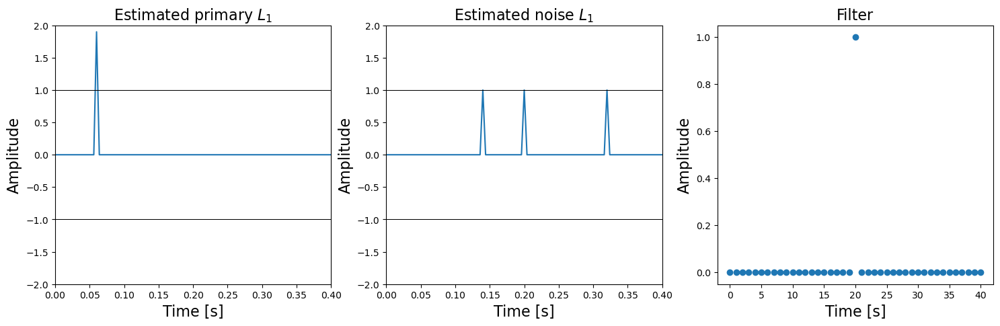

In [239]:
# plot the estimated primary and the estimated multiples after adaptive subtraction
fig, axs = plt.subplots(1, 3, figsize=(18, 5))
axs[0].plot(t, primary_l1)
axs[0].set_ylim(-2,2);
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel('Time [s]', fontsize=16);
axs[0].set_title('Estimated primary $L_1$', fontsize=16)
axs[0].set_xlim(0, 0.4)
axs[0].axhline(y=1, color='k', linewidth=0.75)
axs[0].axhline(y=-1, color='k', linewidth=0.75)
axs[1].plot(t, multiple_l1)
axs[1].axhline(y=1, color='k', linewidth=0.75)
axs[1].axhline(y=-1, color='k', linewidth=0.75)
axs[1].set_ylim(-2,2);
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[1].set_xlabel('Time [s]', fontsize=16);
axs[1].set_title('Estimated noise $L_1$', fontsize=16);
axs[1].set_xlim(0, 0.4);
axs[2].plot(filt_l1,'o')
axs[2].set_ylabel('Amplitude', fontsize=16)
axs[2].set_title('Filter', fontsize=16);
axs[2].set_xlabel('Time [s]', fontsize=16)
# plt.tight_layout()
plt.show()

Let's compare the energy for the $L_2$-norm and the $L_1$-norm:

In [240]:
print(f'Energy for L_2-norm solution: {np.linalg.norm(data - multiple_est)**2:.2f}')
print(f'Energy for L_1-norm solution: {np.linalg.norm(multiple_l1 - data)**2:.2f}')

Energy for L_2-norm solution: 2.17
Energy for L_1-norm solution: 3.61


From this example we see that the $L_1$-norm is a more appropriate norm when there is a strong primary dominating the energy. Even though the energy for the $L_1$-norm solution is higher, the reconstructed primaries and multiples are correct. 

This example is quite simple because it is 1D. More importantly, the example is simple because the estimated multiples and the actual multiples in the total data are the same. In most cases, the predicted multiples are not aligned with the multiples in the total data, and that is why adaptive subtraction is needed. 

## Synthetic data example

Now we will move on to apply the ADMM to whole seismic shots. Import the seismic shots and primaries (299, 300 and 301) from the dataset and predicted multiples generated in the previous notebooks.

In [4]:
data = np.load('../data/data.npz')['arr_0'][299:302]
primaries = np.load('../data/primaries.npz')['arr_0'][299:302]
multiples = np.load('../data/srme_multiples.npz')['arr_0']

In [5]:
# Obtain true multiples by subtracting
true_multiples = data - primaries

In [6]:
nr = data.shape[1]
nt = data.shape[2]

dt = 0.004    # s
dx = 10       # m

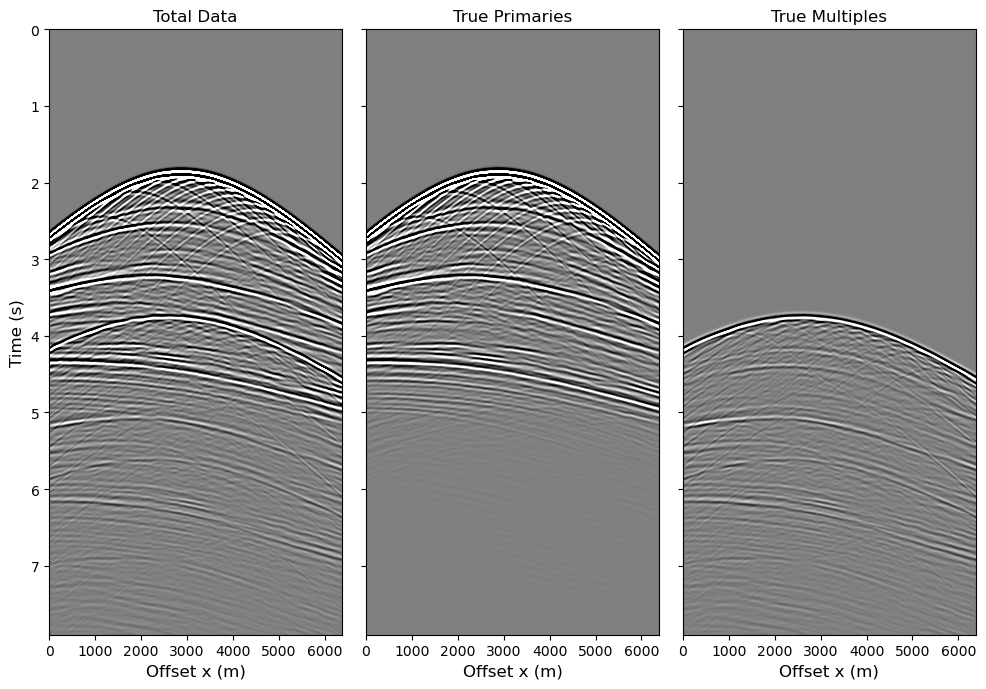

In [7]:
# Visualize data
t0 = 0
t1 = t0 + (nt - 1)*dt
xmin = 0
xmax = nr*dx

vmax = 0.04 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(data[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('Total Data',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(primaries[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('True Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(true_multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('True Multiples',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

Relative error: 47.64%


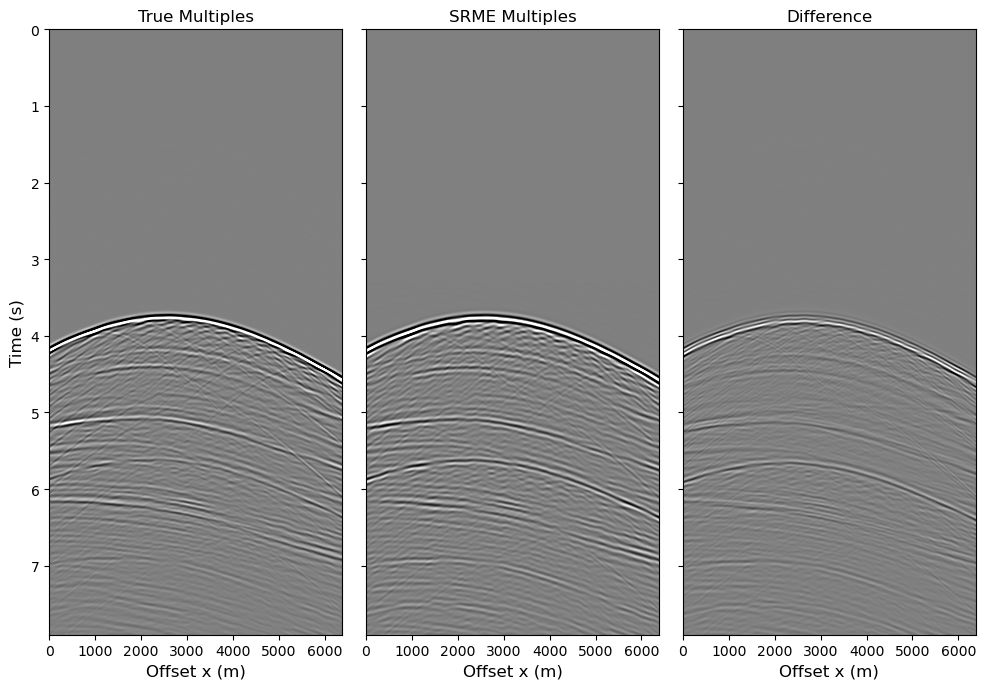

In [8]:
# Visualize data

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('SRME Multiples',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((true_multiples[1]-multiples[1]).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

# Print relative error betw|een true and estimated multiples
print('Relative error: %.2f%%'% (100*np.linalg.norm(true_multiples[1]-multiples[1])/np.linalg.norm(true_multiples[1])))

plt.tight_layout()

The adaptive subtraction is performed on overlapping windows or patches, since one global filter would not accommodate effectively the predicted multiples to the multiples in the data (underfitting). For the synthetic dataset, we will create patches of size 58x146 (space samples x time samples). 

In [17]:
# Choose size of window. Must be even numbers
nwin = (58, 146)

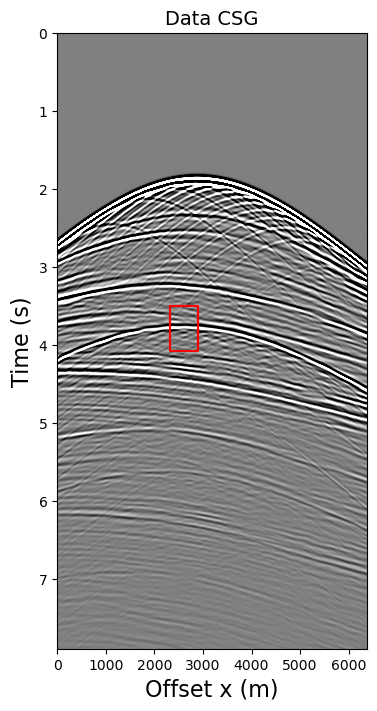

In [18]:
# Show one patch
fig, axs = plt.subplots(1, 1, figsize=(4,8),sharey=True)
axs.imshow(data[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs.set_title(f'Data CSG',fontsize=14)
axs.set_xlabel('Offset x (m)',fontsize=16)
axs.set_ylabel('Time (s)',fontsize=16)

x, y, = np.array([4*nwin[0], 4*nwin[0], 5*nwin[0], 5*nwin[0], 4*nwin[0]])*dx, np.array([6*nwin[1], 7*nwin[1], 7*nwin[1], 6*nwin[1], 6*nwin[1]])*dt
plt.plot(x, y, c='r', lw=1.5)

plt.show()

In [19]:
# Create patching operator
nwin = nwin  #number of samples of window
nover = (nwin[0]//2, nwin[1]//2)  #number of samples of overlapping part of window

In [20]:
# Find how many samples are included for the current patching
nr = (nover[0]) * (data.shape[1] // nover[0])
nt = (nover[1]) * (data.shape[2] // nover[1])
print(f'-nr: {nr} \n-nt: {nt}')

-nr: 638 
-nt: 1971


In [21]:
# Reshape input data to fit output once patched
data = data[:, :nr, :nt]
primaries = primaries[:, :nr, :nt]
multiples = multiples[:, :nr, :nt]
true_multiples = true_multiples[:, :nr, :nt]

In [22]:
dimsd = (nr, nt)  #shape of 2-dimensional data
nop = nwin        #size of model in the transformed domain
nwins = (nr // (nwin[0]//2) - 1, nt // (nwin[1]//2) - 1)  #number of windows
dims = (nwins[0]*nop[0], nwins[1]*nop[1])    #shape of 2-dimensional model
I = pylops.Identity(nwin[0]*nwin[1])

# Get the patching operators
PatchOpH = pylops.signalprocessing.Patch2D(I, dims, dimsd, nwin, nover, nop, tapertype='none', design=False)

PatchOp  = pylops.signalprocessing.Patch2D(I, dims, dimsd, nwin, nover, nop, tapertype='hanning', design=False)

# Patch the data
data_patched = PatchOpH.H * data[1].ravel()
multiples_patched = PatchOpH.H * multiples[1].ravel()
true_multiples_patched = PatchOpH.H * true_multiples[1].ravel()

Let's check whether the patching operators are correct.

In [23]:
data_back = PatchOp * data_patched
data_back = data_back.reshape(data[1].shape)
np.linalg.norm(data[1] - data_back)

1.0140210307553277e-15

In [24]:
# Reorder the data so that every row is a single patch
num_patches = nwins[0] * nwins[1]
data_patched = np.reshape(data_patched, (num_patches, nwin[0]*nwin[1]))
multiples_patched = np.reshape(multiples_patched, (num_patches, nwin[0]*nwin[1]))
true_multiples_patched = np.reshape(true_multiples_patched, (num_patches, nwin[0]*nwin[1]))

# Choose a size for the filter. Must be odd number
nfilt = 11

# Create an array to store filters
filters = np.zeros((num_patches, nfilt))
primary_est = np.zeros_like(data_patched)
multiple_est = np.zeros_like(multiples_patched)

We are going to do adaptive subtraction using LSQR for this example.

In [25]:
# Perform adaptive subtraction for each patch

for i in range(num_patches):
    data_patch_i = np.reshape(data_patched[i], (nwin[0], nwin[1]))
    mult_patch_i = np.reshape(multiples_patched[i], (nwin[0], nwin[1]))
    CopStack = []
    # construct the convolutional operator
    for j in range(nwin[0]):
        C = pylops.utils.signalprocessing.convmtx(mult_patch_i[j], nfilt)
        Cop = pylops.basicoperators.MatrixMult(C[nfilt//2:-(nfilt//2)])
        CopStack.append(Cop)
    dataStack = data_patch_i.ravel()
    CopStack  = pylops.VStack(CopStack)
    # Solve for the filter
    filt_est = lsqr(CopStack, dataStack, x0=np.zeros(nfilt), damp=1e-2, niter=15)[0];    #find solution
    
    # Clip filters, in case they 'blow up' in zero (or almost zero) patches
    if max(abs(filt_est)) > 10:
        filt_est = np.ones(nfilt)
    
    # Store results
    filters[i] = filt_est
    multiple_est[i] = (CopStack * filt_est).T                                #apply solution
    primary_est[i]  = (dataStack - multiple_est[i].T).T

 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact solution is x = 0                               
 
LSQR finished
The exact

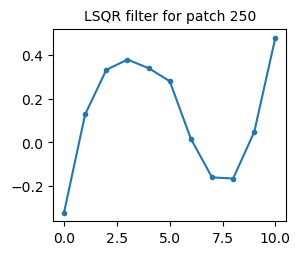

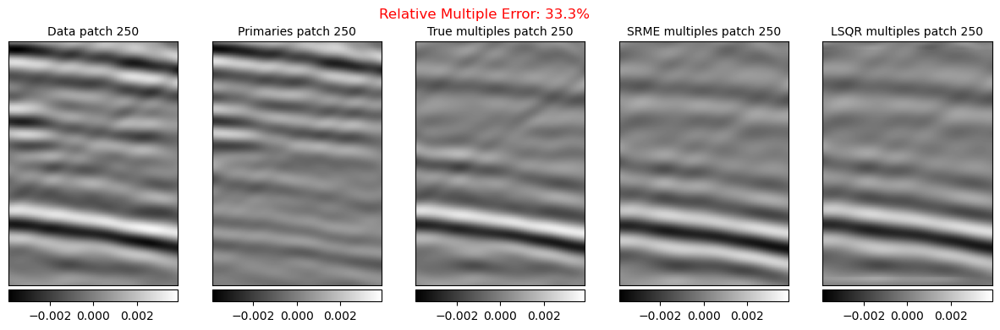

In [26]:
# Select one patch number
i = 250

plt.figure(figsize=(3,2.5))
plt.plot(filters[i], marker='o', markersize=3)
plt.title(f'LSQR filter for patch {i}', fontsize=10)

data_patch_i = np.reshape(data_patched[i], (nwin[0], nwin[1]))
mult_patch_i = np.reshape(multiples_patched[i], (nwin[0], nwin[1]))
true_mult_patch_i = np.reshape(true_multiples_patched[i], (nwin[0], nwin[1]))
multiple_est_i = np.reshape(multiple_est[i], (nwin[0], nwin[1]))

fig, axs = plt.subplots(1, 5, figsize=(15, 4), sharey=True)

vmax=np.max(abs(data_patch_i))
vmin=-vmax

im0 = axs[0].imshow(data_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
axs[0].set_title(f'Data patch {i}', fontsize=10)
axs[0].xaxis.set_tick_params(labelbottom=False)
axs[0].yaxis.set_tick_params(labelleft=False)     
axs[0].set_xticks([])
axs[0].set_yticks([])
divider = make_axes_locatable(axs[0])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
fig.colorbar(im0, cax=cax, orientation='horizontal')

im1 = axs[1].imshow((data_patch_i - mult_patch_i).T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
axs[1].set_title(f'Primaries patch {i}', fontsize=10)
axs[1].xaxis.set_tick_params(labelbottom=False)
axs[1].yaxis.set_tick_params(labelleft=False)     
axs[1].set_xticks([])
axs[1].set_yticks([])
divider = make_axes_locatable(axs[1])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='horizontal')

im2 = axs[2].imshow(true_mult_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
axs[2].set_title(f'True multiples patch {i}', fontsize=10)
axs[2].xaxis.set_tick_params(labelbottom=False)
axs[2].yaxis.set_tick_params(labelleft=False)     
axs[2].set_xticks([])
axs[2].set_yticks([])
divider = make_axes_locatable(axs[2])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='horizontal')

im3 = axs[3].imshow(mult_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
axs[3].set_title(f'SRME multiples patch {i}', fontsize=10)
axs[3].xaxis.set_tick_params(labelbottom=False)
axs[3].yaxis.set_tick_params(labelleft=False)     
axs[3].set_xticks([])
axs[3].set_yticks([])
divider = make_axes_locatable(axs[3])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
fig.colorbar(im3, cax=cax, orientation='horizontal')

im4 = axs[4].imshow(multiple_est_i .T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
axs[4].set_title(f'LSQR multiples patch {i}', fontsize=10)
axs[4].xaxis.set_tick_params(labelbottom=False)
axs[4].yaxis.set_tick_params(labelleft=False)     
axs[4].set_xticks([])
axs[4].set_yticks([])
divider = make_axes_locatable(axs[4])
cax = divider.append_axes('bottom', size='5%', pad=0.05)
fig.colorbar(im4, cax=cax, orientation='horizontal')   

re = np.linalg.norm(multiple_est_i-true_mult_patch_i)*100/np.linalg.norm(true_mult_patch_i)
plt.suptitle(f'Relative Multiple Error: {round(re,2)}%', c='r')

plt.show()

Apply the adjoint of the Patching Operator to patch back the data.

In [27]:
# Glue the patches back together
primary_est = PatchOp * primary_est.ravel()
multiple_est = PatchOp * multiple_est.ravel()
lsqr_prim = np.reshape(primary_est, (nr, nt))
lsqr_mult = np.reshape(multiple_est, (nr, nt))

Plot complete corrected shots.

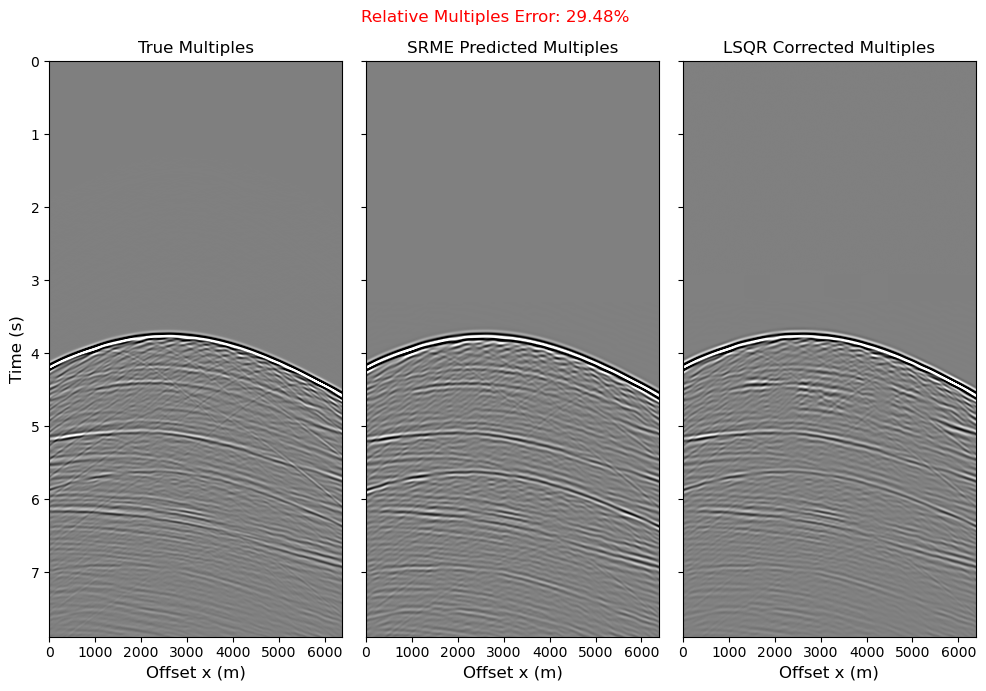

In [29]:
vmax = 0.04 * np.amax(data)
vmin = -vmax

t0 = 0
t1 = t0 + (nt - 1)*dt
xmin = 0
xmax = nr*dx

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('SRME Predicted Multiples',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(lsqr_mult.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('LSQR Corrected Multiples',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(lsqr_mult-true_multiples[1])*100/np.linalg.norm(true_multiples[1])
plt.suptitle(f'Relative Multiples Error: {round(re,2)}%', c='r')

plt.tight_layout()

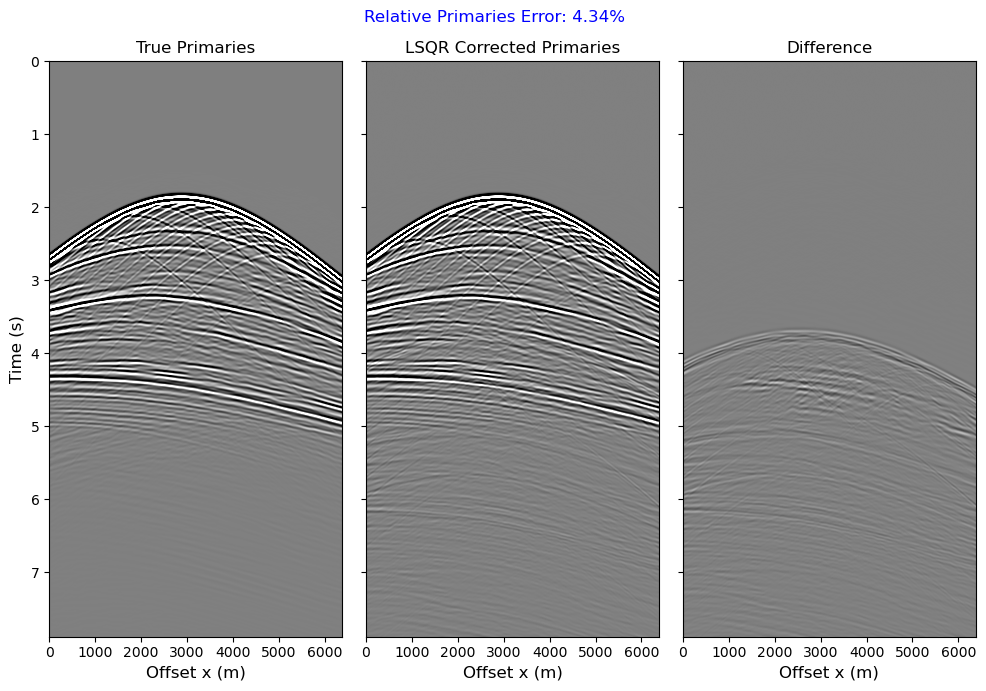

In [30]:
fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(lsqr_prim.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('LSQR Corrected Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[1]-lsqr_prim).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(lsqr_prim-primaries[1])*100/np.linalg.norm(primaries[1])
plt.suptitle(f'Relative Primaries Error: {round(re,2)}%', c='b')

plt.tight_layout()

## ADMM

Adaptive subtraction with the ADMM can be conducted through 4 different modes:

**(a) Independent patches optimization - single multiples CSG:**
<br/> Solve optimization for each patch using single multiples CSG corresponding to the same data CSG (in this case #300). This mode can be carried out with 2 functions:
- **_adasubtraction_** -> wrapper for the code presented before, is much slower for the ADMM compared to the LSQR.
- **_adasubtraction_parallel_** -> employs many CPU cores to parallelize processes and reduce computation time.

**(b) Independent patches optimization - three consecutive multiples CSGs:**
<br/> Solve optimization for each patch using single three multiples CSGs corresponding to the previous, same and following data CSGs (in this case #299, #300 and #301). Instead of only 1 solution (filter), you obtain 3 solutions (see figure below). The function **_adasubtraction_mult_** takes an array of three multiples shots as input and performs the adaptive subtraction only in a parallelized manner.

**(c) Joint patches optimization - single multiples CSG:**
<br/> Solve regularized joint optimization with all patches, using single multiples CSG corresponding to the same data CSG. The regularization is a smoothing operator along the vertical and/or horizontal filters axis, to impose similarity between filters along desired direction. Utilize the function **_adasubtraction_joint_** for this mode.

**(d) Joint patches optimization - three consecutive multiples CSGs:**
<br/> Solve regularized joint optimization with all patches, using three multiples CSGs corresponding to the previous, same and following data CSGs. The same function is used as in **c)**, but you can also smooth along the multiples shots filters axis, meaning that you can enforce resemblance between filters of each shot.

<img src="../figures/adaptive_subtraction_modes.png"> 

Now we will test for each mode of the ADMM and present some filters and total results. Let's define a function to plot some patches with their filter (s).

In [31]:
def plot_patches(data, true_multiples, srme_multiples, admm_multiples, nwin, filters, mult_filters=None, patches=None):
    
    nover = (nwin[0] // 2, nwin[1] // 2)  # number of samples of overlapping part of windows
    # Create patching operator
    dimsd = (nr, nt)  # shape of 2-dimensional data
    nop = nwin  # size of model in the transformed domain
    nwins = (nr // (nwin[0] // 2) - 1, nt // (nwin[1] // 2) - 1)
    dims = (nwins[0] * nop[0], nwins[1] * nop[1])
    I = pylops.Identity(nwin[0] * nwin[1])

    # Get the patching operators
    PatchOpH = pylops.signalprocessing.Patch2D(I, dims, dimsd, nwin, nover, nop, tapertype='none', design=False)
    PatchOp = pylops.signalprocessing.Patch2D(I, dims, dimsd, nwin, nover, nop, tapertype='hanning', design=False)

    # Patch the data
    data_patched = PatchOpH.H * data.ravel()
    true_mult_patched = PatchOpH.H * true_multiples.ravel()
    corr_mult_patched = PatchOpH.H * srme_multiples.ravel()
    est_mult_patched = PatchOpH.H * admm_multiples.ravel()

    # Reorder the data so that every row is a single patch
    num_patches = nwins[0] * nwins[1]
    
    data_patched = np.reshape(data_patched, (num_patches, nwin[0] * nwin[1]))
    true_mult_patched = np.reshape(true_mult_patched, (num_patches, nwin[0] * nwin[1]))
    corr_mult_patched = np.reshape(corr_mult_patched, (num_patches, nwin[0] * nwin[1]))
    est_mult_patched = np.reshape(est_mult_patched, (num_patches, nwin[0] * nwin[1]))
    
    print('Number of patches: ', num_patches)
    
    if patches is None:
        
        patches = np.arange(num_patches)    
    
    for i in patches:

        data_patch_i = np.reshape(data_patched[i], (nwin[0], nwin[1])) 
        true_mult_patch_i = np.reshape(true_mult_patched[i], (nwin[0], nwin[1]))       
        corr_mult_patch_i = np.reshape(corr_mult_patched[i], (nwin[0], nwin[1]))
        est_mult_patch_i = np.reshape(est_mult_patched[i], (nwin[0], nwin[1]))
        
        if mult_filters is not None:
            
            fig, axs = plt.subplots(1, 3, figsize=(10, 2.5), sharey=True)

            axs[0].plot(mult_filters[i, 0], marker='o', markersize=3)
            axs[0].set_title(f'ADMM filter for patch {i} shot i-1', fontsize=10)

            axs[1].plot(mult_filters[i, 1], marker='o', markersize=3, label='Using 3 Shots')
            axs[1].plot(filters[i], marker='o', markersize=3, label='Using 1 Shot')
            axs[1].set_title(f'ADMM filter for patch {i} shot i', fontsize=10)

            axs[2].plot(mult_filters[i, 2], marker='o', markersize=3)
            axs[2].set_title(f'ADMM filter for patch {i} shot i+1', fontsize=10)

            axs[1].legend(fontsize=8)  
        
        else:
            
            plt.figure(figsize=(3,2.5))
            plt.plot(filters[i], marker='o', markersize=3)
            plt.title(f'ADMM filter for patch {i}', fontsize=10)

        fig, axs = plt.subplots(1, 5, figsize=(15, 4), sharey=True)
        
        vmax= 0.04*np.max(abs(data))
        vmin=-vmax

        im0 = axs[0].imshow(data_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[0].set_title(f'Data patch {i}', fontsize=10)
        axs[0].xaxis.set_tick_params(labelbottom=False)
        axs[0].yaxis.set_tick_params(labelleft=False)     
        axs[0].set_xticks([])
        axs[0].set_yticks([])
        divider = make_axes_locatable(axs[0])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im0, cax=cax, orientation='horizontal')
    
        im1 = axs[1].imshow((data_patch_i - true_mult_patch_i).T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[1].set_title(f'Primaries patch {i}', fontsize=10)
        axs[1].xaxis.set_tick_params(labelbottom=False)
        axs[1].yaxis.set_tick_params(labelleft=False)     
        axs[1].set_xticks([])
        axs[1].set_yticks([])
        divider = make_axes_locatable(axs[1])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im1, cax=cax, orientation='horizontal')
        
        im2 = axs[2].imshow(true_mult_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[2].set_title(f'True multiples patch {i}', fontsize=10)
        axs[2].xaxis.set_tick_params(labelbottom=False)
        axs[2].yaxis.set_tick_params(labelleft=False)     
        axs[2].set_xticks([])
        axs[2].set_yticks([])
        divider = make_axes_locatable(axs[2])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im2, cax=cax, orientation='horizontal')
        
        im3 = axs[3].imshow(corr_mult_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[3].set_title(f'SRME multiples patch {i}', fontsize=10)
        axs[3].xaxis.set_tick_params(labelbottom=False)
        axs[3].yaxis.set_tick_params(labelleft=False)     
        axs[3].set_xticks([])
        axs[3].set_yticks([])
        divider = make_axes_locatable(axs[3])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im3, cax=cax, orientation='horizontal')
        
        im4 = axs[4].imshow(est_mult_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[4].set_title(f'ADMM multiples patch {i}', fontsize=10)
        axs[4].xaxis.set_tick_params(labelbottom=False)
        axs[4].yaxis.set_tick_params(labelleft=False)     
        axs[4].set_xticks([])
        axs[4].set_yticks([])
        divider = make_axes_locatable(axs[4])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im4, cax=cax, orientation='horizontal')   
        
        re = np.linalg.norm(est_mult_patch_i-true_mult_patch_i)*100/np.linalg.norm(true_mult_patch_i)
        plt.suptitle(f'Relative Multiple Error: {round(re,2)}%', c='r')

        plt.tight_layout()
        plt.show()

In order to obtain better results, is necessary to conduct a grid search on the following parameters:
- **nfilt**: size of the filter 
- **eps**: L1 regularization parameter
- **rho**: Augmented Lagrangian penalty parameter

In [32]:
nfilt = 11
eps = 0.04
rho = 10  

### Case (a)
Using multiproccesing with 15 CPU cores to speed up the operations.

In [33]:
start_time = time.time()/60

admm_prim_a, admm_mult_a, admm_filt_a = adasubtraction_parallel(data[1], multiples[1], solver='ADMM', nfilt=nfilt,
                                                                                    nwin=nwin,
                                                                                    cpu_num=15,
                                                                                    solver_dict={'rho':rho,
                                                                                                 'nouter':200,
                                                                                                 'ninner':5,
                                                                                                 'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 0.328 minutes ---


Number of patches:  546


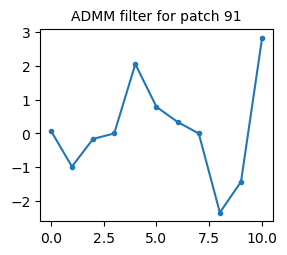

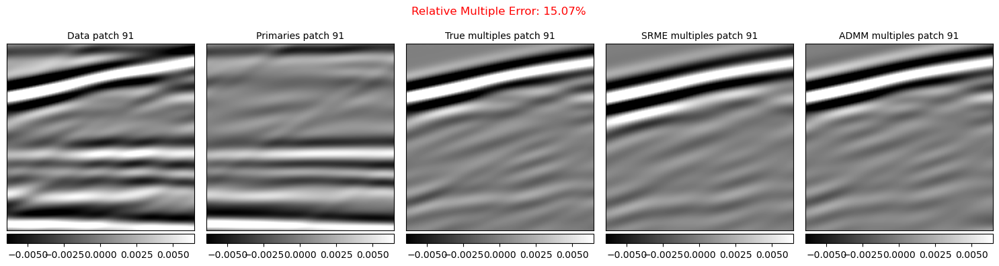

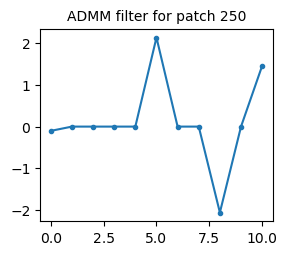

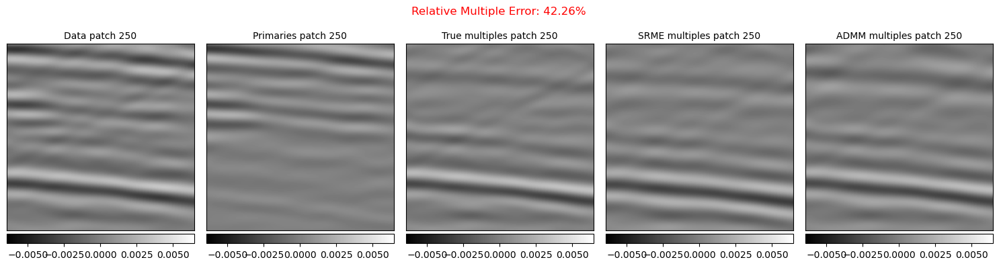

In [34]:
plot_patches(data[1], true_multiples[1], multiples[1], admm_mult_a, nwin, admm_filt_a, mult_filters=None, patches=[91, 250])

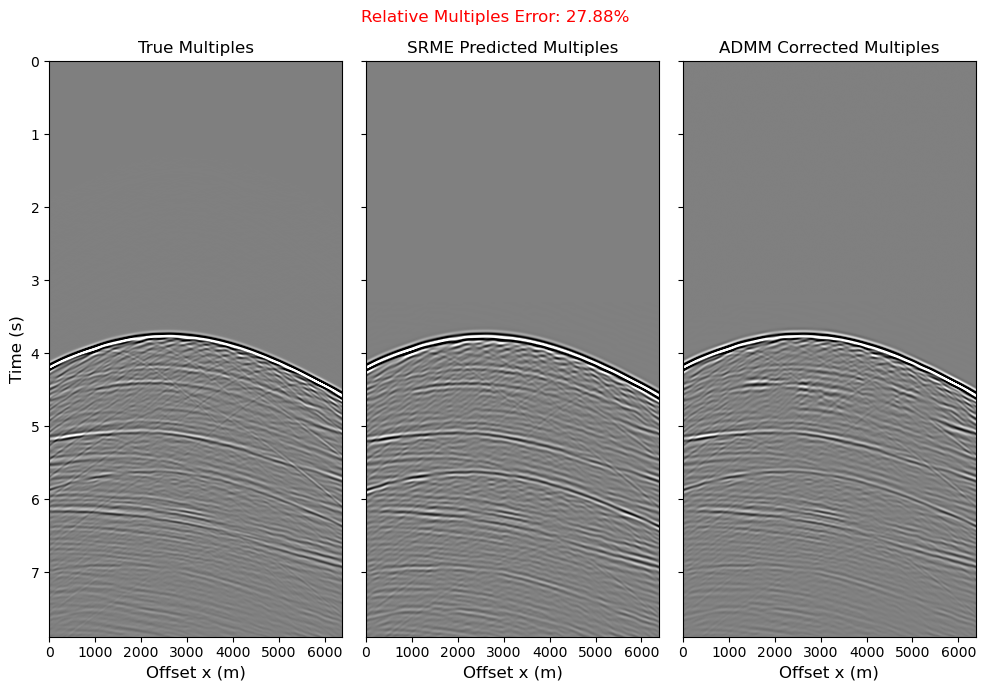

In [35]:
vmax = 0.04 * np.amax(data)
vmin = -vmax

t0 = 0
t1 = t0 + (nt - 1)*dt
xmin = 0
xmax = nr*dx

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('SRME Predicted Multiples',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(admm_mult_a.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('ADMM Corrected Multiples',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(admm_mult_a-true_multiples[1])*100/np.linalg.norm(true_multiples[1])
plt.suptitle(f'Relative Multiples Error: {round(re,2)}%', c='r')

plt.tight_layout()

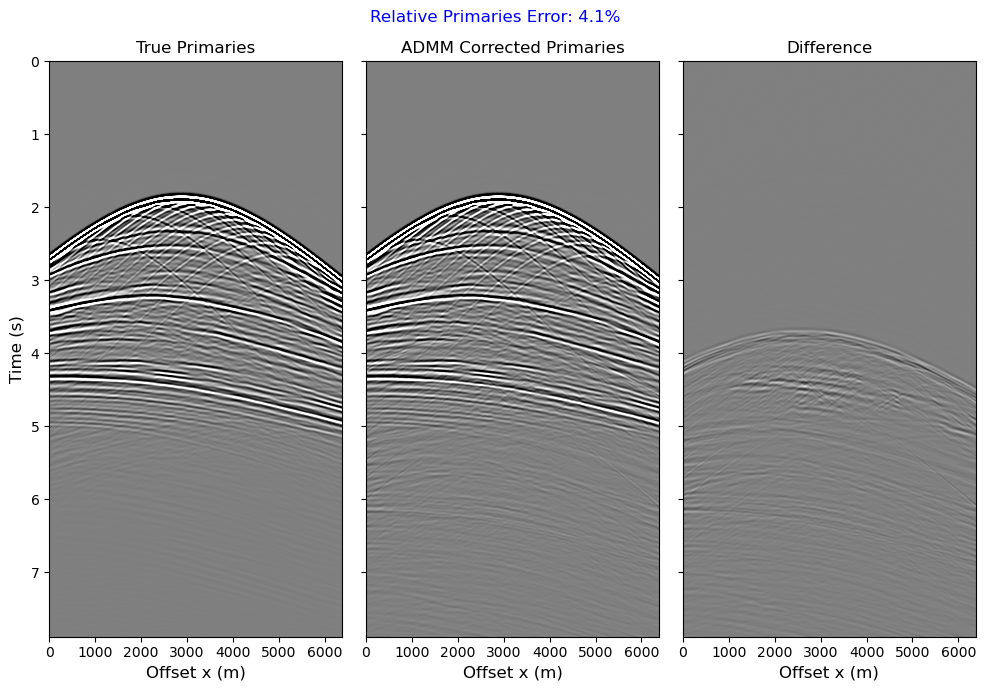

In [36]:
fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(admm_prim_a.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('ADMM Corrected Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[1]-admm_prim_a).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(admm_prim_a-primaries[1])*100/np.linalg.norm(primaries[1])
plt.suptitle(f'Relative Primaries Error: {round(re,2)}%', c='b')

plt.tight_layout()

### Case (b)
Use all imported SRME multiples as input.

In [37]:
start_time = time.time()/60

admm_prim_b, admm_mult_b, admm_filt_b = adasubtraction_mult(data[1], multiples, solver='ADMM', nfilt=nfilt,
                                                                                    nwin=nwin,
                                                                                    cpu_num=15,
                                                                                    solver_dict={'rho':rho,
                                                                                                 'nouter':200,
                                                                                                 'ninner':5,
                                                                                                 'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 1.022 minutes ---


Number of patches:  546


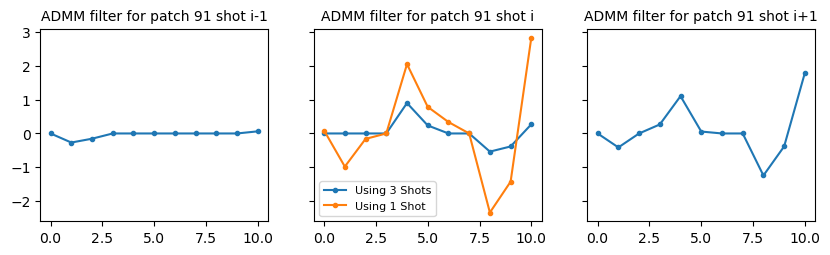

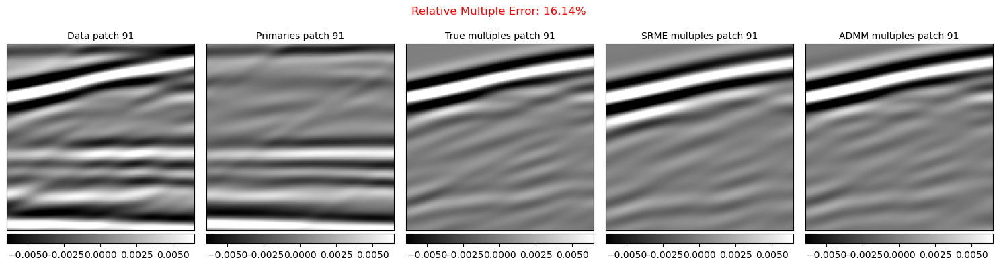

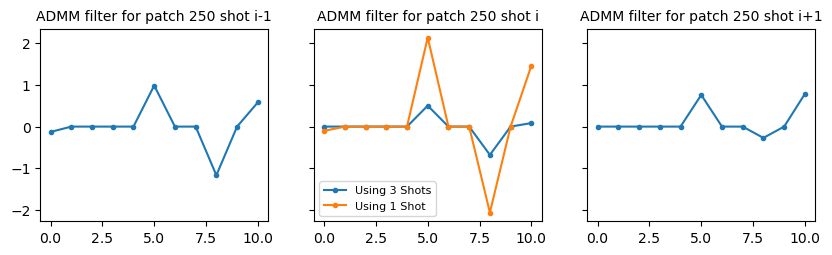

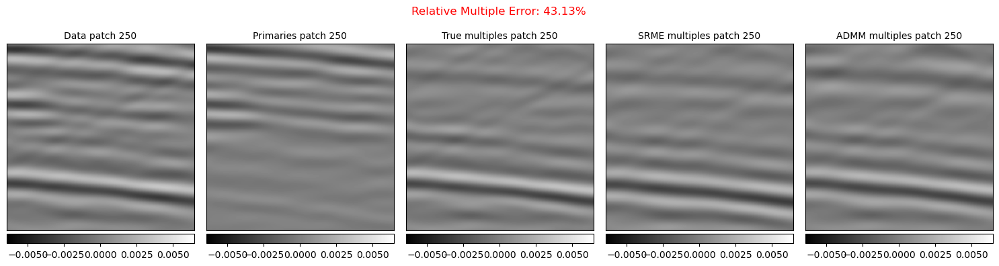

In [38]:
plot_patches(data[1], true_multiples[1], multiples[1], admm_mult_b, nwin, admm_filt_a, mult_filters=admm_filt_b, patches=[91, 250])

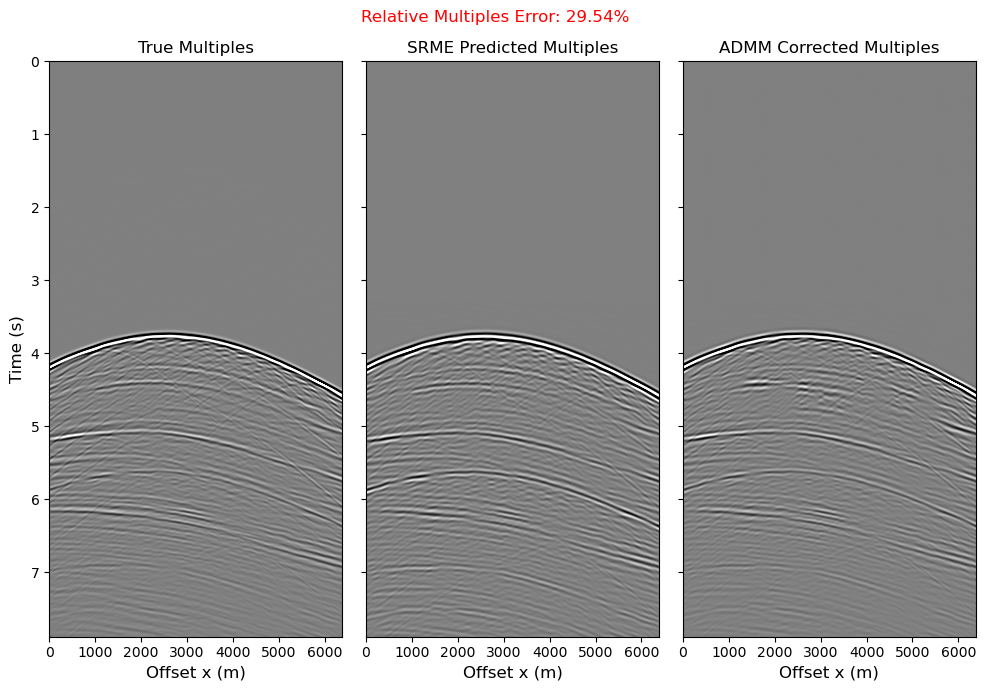

In [39]:
vmax = 0.04 * np.amax(data)
vmin = -vmax

t0 = 0
t1 = t0 + (nt - 1)*dt
xmin = 0
xmax = nr*dx

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('SRME Predicted Multiples',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(admm_mult_a.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('ADMM Corrected Multiples',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(admm_mult_b-true_multiples[1])*100/np.linalg.norm(true_multiples[1])
plt.suptitle(f'Relative Multiples Error: {round(re,2)}%', c='r')

plt.tight_layout()

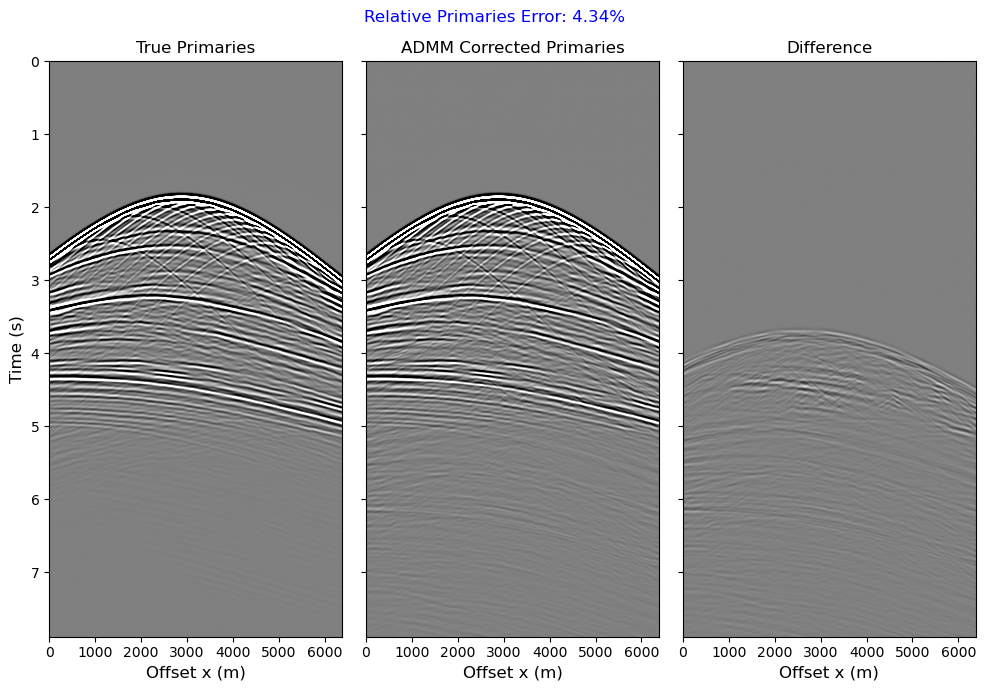

In [40]:
fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(admm_prim_b.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('ADMM Corrected Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[1]-admm_prim_b).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(admm_prim_b-primaries[1])*100/np.linalg.norm(primaries[1])
plt.suptitle(f'Relative Primaries Error: {round(re,2)}%', c='b')

plt.tight_layout()

### Case (c)
Adding smoothing along the X (space) axis.

In [41]:
start_time = time.time()/60

admm_prim_c, admm_mult_c, admm_filt_c = adasubtraction_joint(data[1], multiples[1], solver='ADMM', nfilt=nfilt,
                                                                                    nwin=nwin,
                                                                                    cpu_num=15,
                                                                                    smooth_x=True,
                                                                                    solver_dict={'rho':rho,
                                                                                                 'nouter':200,
                                                                                                 'ninner':5,
                                                                                                 'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 5.968 minutes ---


Number of patches:  546


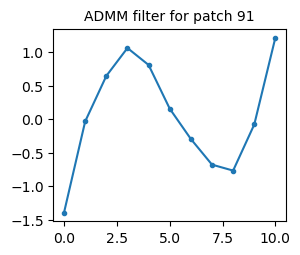

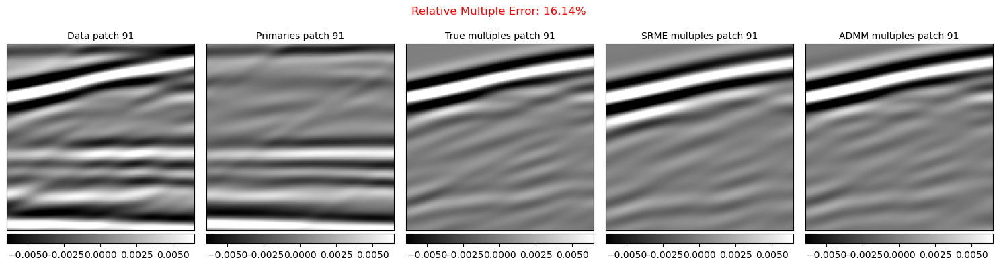

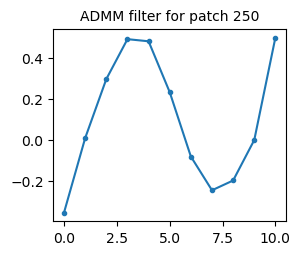

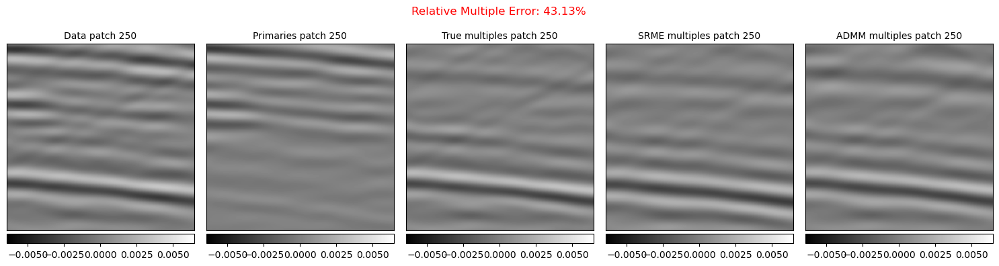

In [42]:
plot_patches(data[1], true_multiples[1], multiples[1], admm_mult_b, nwin, admm_filt_c, mult_filters=None, patches=[91, 250])

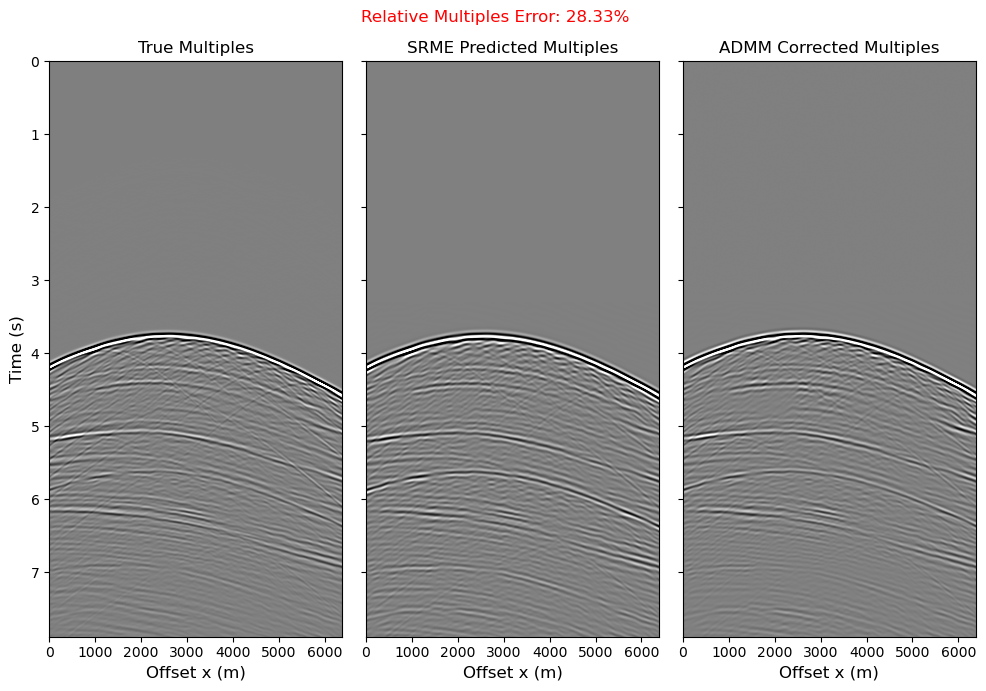

In [43]:
vmax = 0.04 * np.amax(data)
vmin = -vmax

t0 = 0
t1 = t0 + (nt - 1)*dt
xmin = 0
xmax = nr*dx

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('SRME Predicted Multiples',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(admm_mult_c.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('ADMM Corrected Multiples',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(admm_mult_c-true_multiples[1])*100/np.linalg.norm(true_multiples[1])
plt.suptitle(f'Relative Multiples Error: {round(re,2)}%', c='r')

plt.tight_layout()

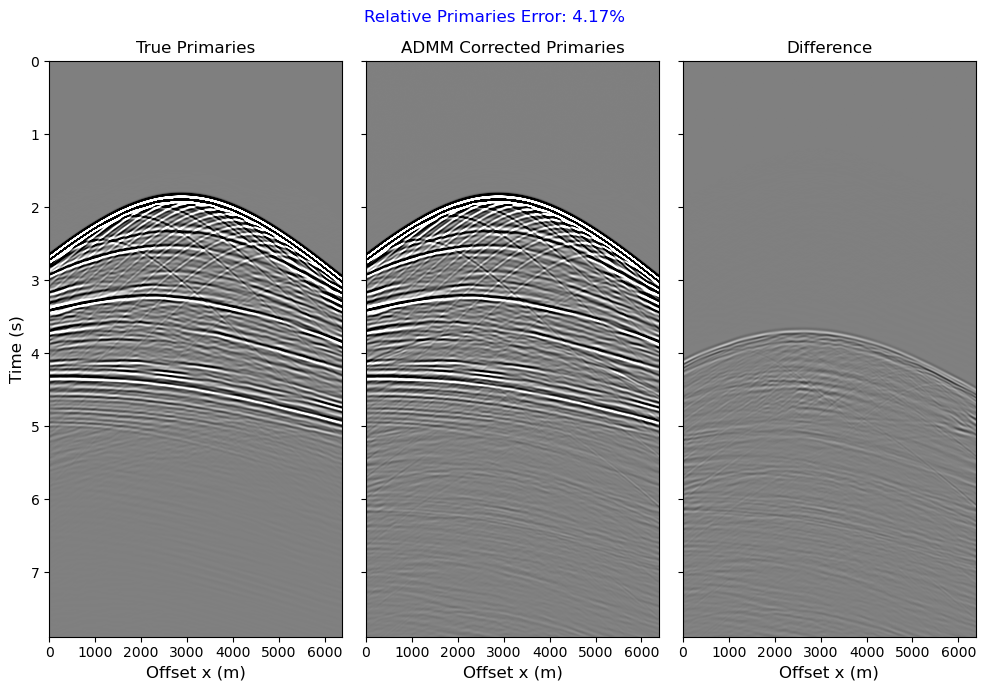

In [44]:
fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(admm_prim_c.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('ADMM Corrected Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[1]-admm_prim_c).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(admm_prim_c-primaries[1])*100/np.linalg.norm(primaries[1])
plt.suptitle(f'Relative Primaries Error: {round(re,2)}%', c='b')

plt.tight_layout()

### Case (d)
Adding smoothing along the multiples (shots) axis.

In [45]:
start_time = time.time()/60

admm_prim_d, admm_mult_d, admm_filt_d = adasubtraction_joint(data[1], multiples, solver='ADMM', nfilt=nfilt,
                                                                                    nwin=nwin,
                                                                                    cpu_num=15,
                                                                                    smooth_mults=True,
                                                                                    solver_dict={'rho':rho,
                                                                                                 'nouter':200,
                                                                                                 'ninner':5,
                                                                                                 'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 15.823 minutes ---


Number of patches:  546


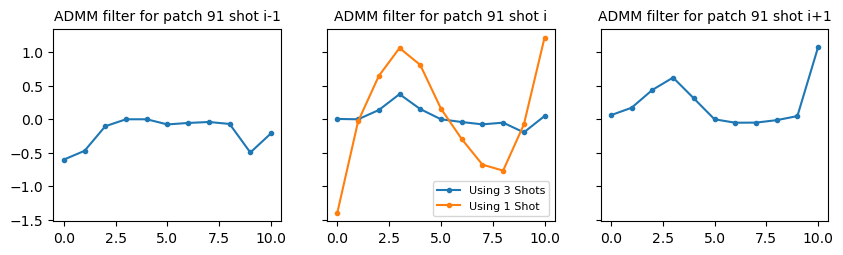

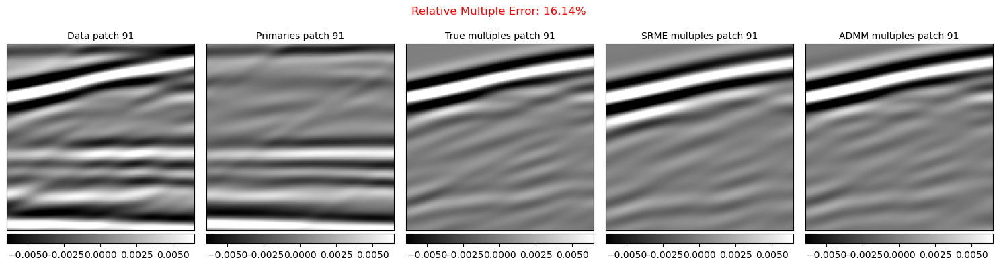

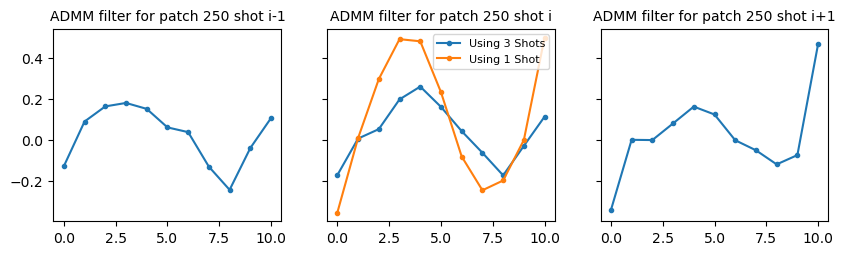

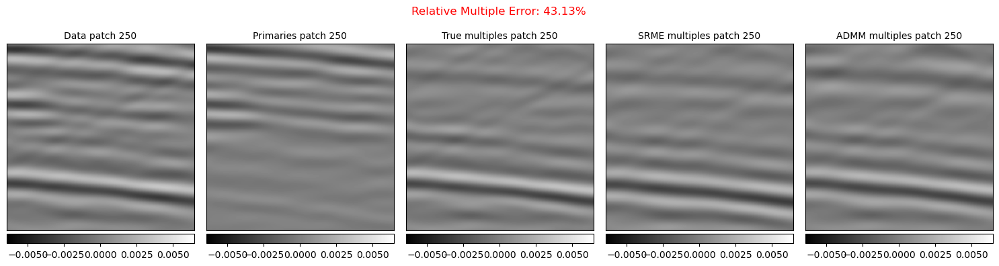

In [46]:
plot_patches(data[1], true_multiples[1], multiples[1], admm_mult_b, nwin, admm_filt_c, mult_filters=admm_filt_d, patches=[91, 250])

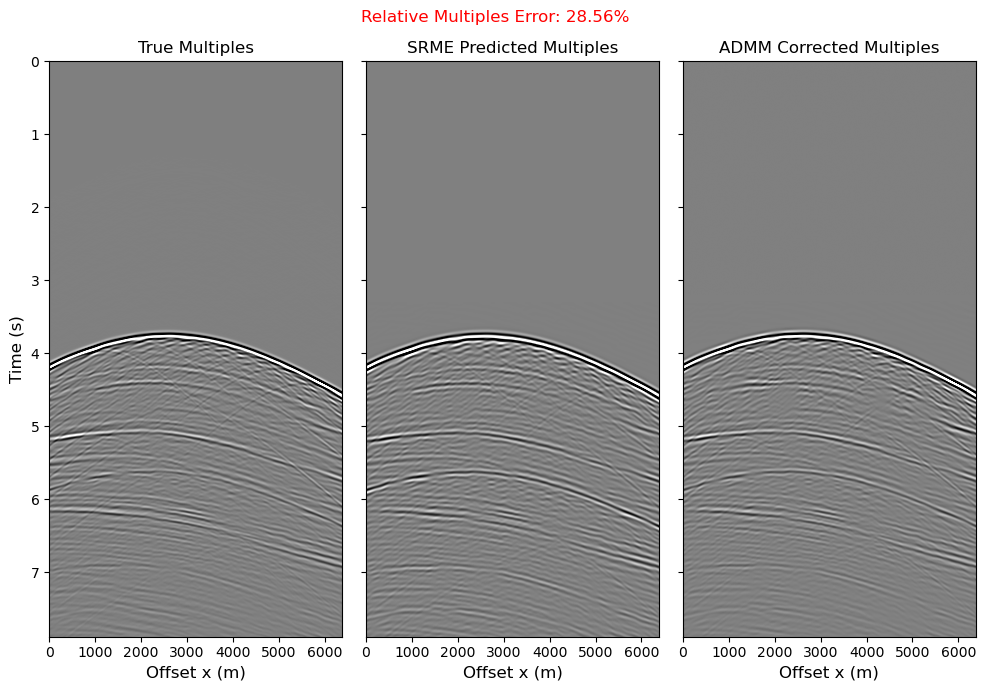

In [47]:
vmax = 0.04 * np.amax(data)
vmin = -vmax

t0 = 0
t1 = t0 + (nt - 1)*dt
xmin = 0
xmax = nr*dx

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('SRME Predicted Multiples',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(admm_mult_d.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('ADMM Corrected Multiples',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(admm_mult_d-true_multiples[1])*100/np.linalg.norm(true_multiples[1])
plt.suptitle(f'Relative Multiples Error: {round(re,2)}%', c='r')

plt.tight_layout()

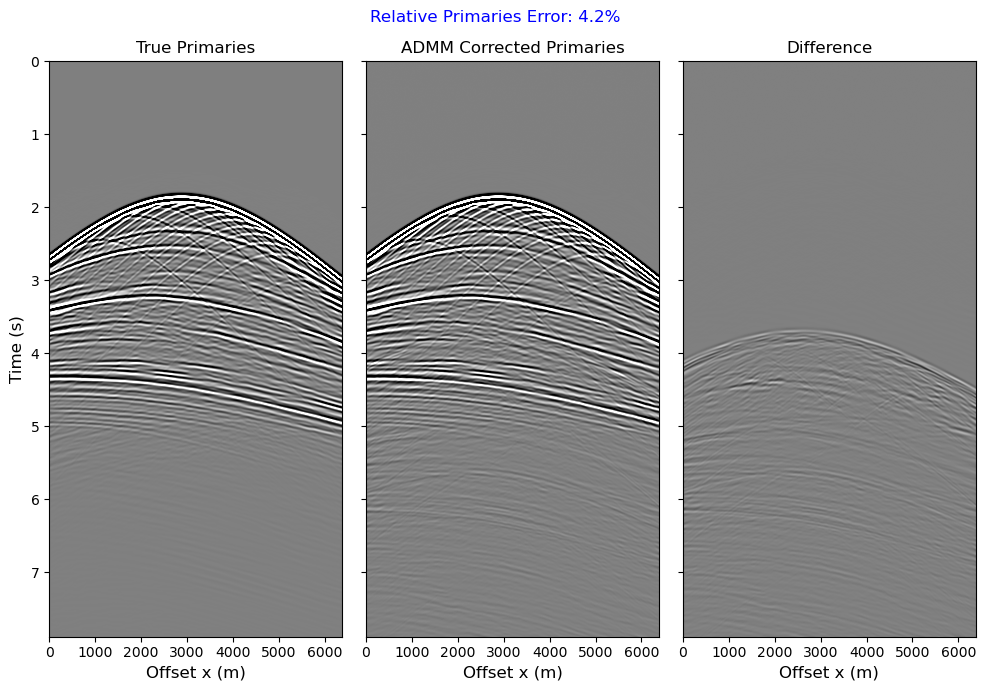

In [48]:
fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[1].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(admm_prim_d.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('ADMM Corrected Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[1]-admm_prim_d).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

re = np.linalg.norm(admm_prim_d-primaries[1])*100/np.linalg.norm(primaries[1])
plt.suptitle(f'Relative Primaries Error: {round(re,2)}%', c='b')

plt.tight_layout()

Adding more complexity to the optimization problem didn't produce better results. When we compare the best result of the LSQR with the best result of the ADMM, they look quite alike. The ADMM is more computational costly, takes much more time and requires a greater grid search. Even if the ADMM is slightly superior, the LSQR appears to be still a more convenient tool for multiples removal.

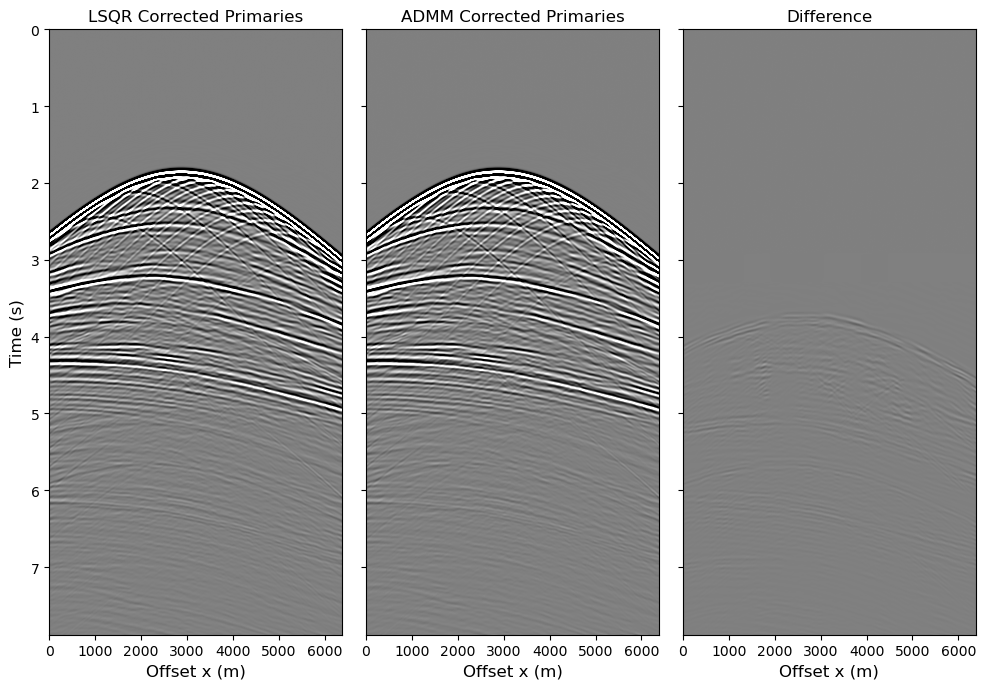

In [49]:
fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

vmax = 0.04 * np.amax(data)
vmin = -vmax

axs[0].imshow(lsqr_prim.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('LSQR Corrected Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(admm_prim_a.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('ADMM Corrected Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((lsqr_prim-admm_prim_a).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

## Real data example
At last, we apply the ADMM algorithm to the Voring 2D streamer dataset, and compare it with the iterative SRME corrected primaries provided by Verschuur. Import and read the shot gathers.

In [50]:
# Total data
filename = '../data/Voring/shots.inter.su'

data = read_gathers(filename)

In [51]:
# Import predicted multiples
filename = '../data/Voring/shots.multwav.su'

multiples = read_gathers(filename)

In [52]:
# Import corrected multiples by iterative SRME
filename = '../data/Voring/shots.srme.su'

srme_primaries = read_gathers(filename)

Plot and compare imported data.

In [53]:
ns = data.shape[0]
nr = data.shape[1]
nt = data.shape[2]

dt = 0.004 # s
dx = 25    # m

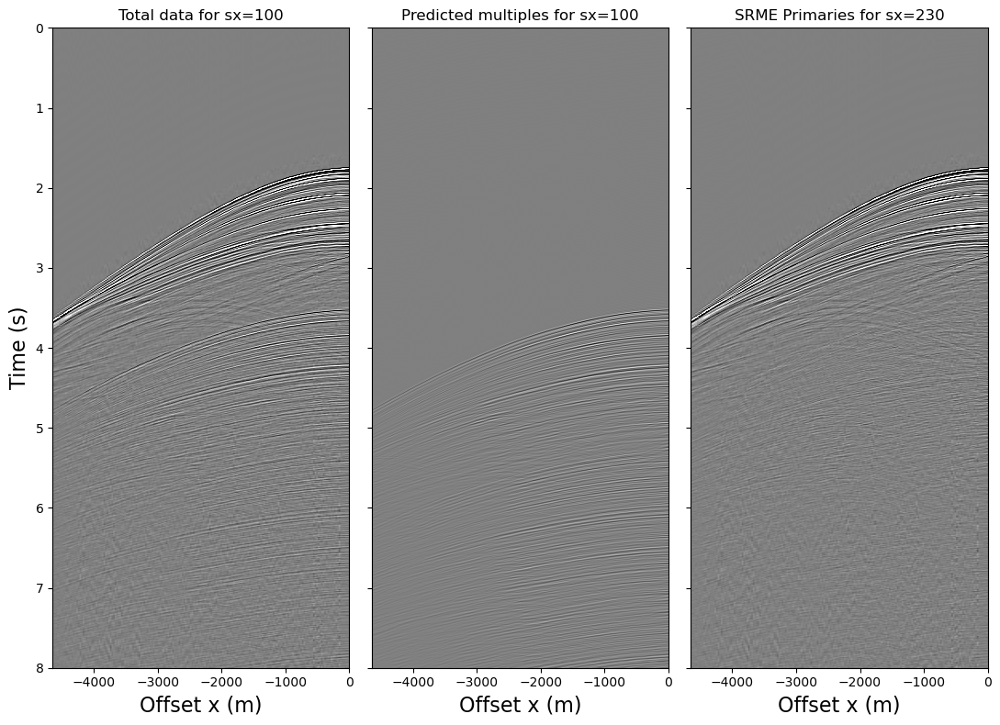

In [54]:
# Plot some imported CSGs

vmax = 0.06 * np.amax(data)
vmin = -vmax

# Plotting parameters
t0 = 0.0
t1 = t0 + (nt - 1) * dt
xmin = -nr * dx
xmax = 0

fig, axs = plt.subplots(1, 3, figsize=(11,8),sharey=True)
axs[0].imshow(data[100].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Total data for sx=100',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)
axs[1].imshow(multiples[100].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'Predicted multiples for sx=100',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=16)
axs[2].imshow(srme_primaries[100].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title(f'SRME Primaries for sx=230',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

plt.tight_layout()

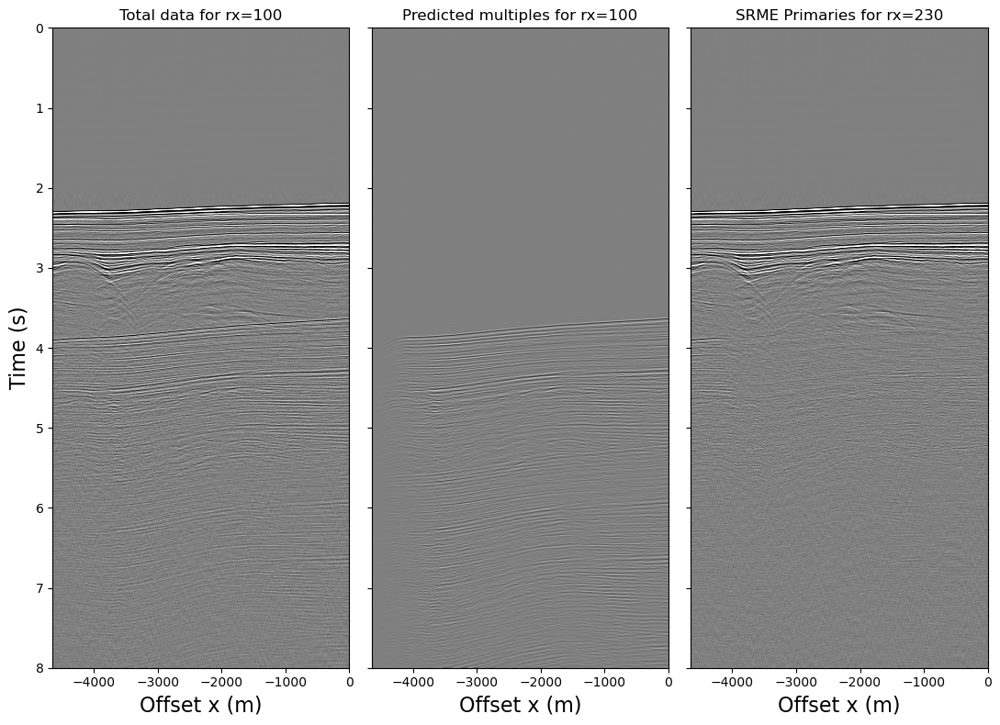

In [55]:
# Now plot CCGs

t0 = 0.0
t1 = t0 + (nt - 1) * dt
xmin = -nr * dx
xmax = 0

fig, axs = plt.subplots(1, 3, figsize=(11,8),sharey=True)
axs[0].imshow(data[:, 100].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Total data for rx=100',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)
axs[1].imshow(multiples[:, 100].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'Predicted multiples for rx=100',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=16)
axs[2].imshow(srme_primaries[:, 100].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title(f'SRME Primaries for rx=230',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

plt.tight_layout()

Conduct adaptive subtraction with the ADMM on one testing shot (#173) and plot results. Choose more fitting input parameters and window size.

In [56]:
nwin = (30, 150)

nfilt = 19
eps = 1
rho = 1

In [57]:
start_time = time.time()/60

admm_primaries_test, admm_multiples_test, _ = adasubtraction_parallel(data[173], multiples[173], solver='ADMM', nfilt=nfilt,
                                                                                    nwin=nwin,
                                                                                    cpu_num=15,
                                                                                    solver_dict={'rho':rho,
                                                                                                 'nouter':200,
                                                                                                 'ninner':5,
                                                                                                 'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 0.121 minutes ---


In [58]:
# Reshape input data to match output

nr = admm_primaries_test.shape[0]
nt = admm_primaries_test.shape[1]

data = data[:, :nr, :nt]
multiples = multiples[:, :nr, :nt]
srme_primaries = srme_primaries[:, :nr, :nt]

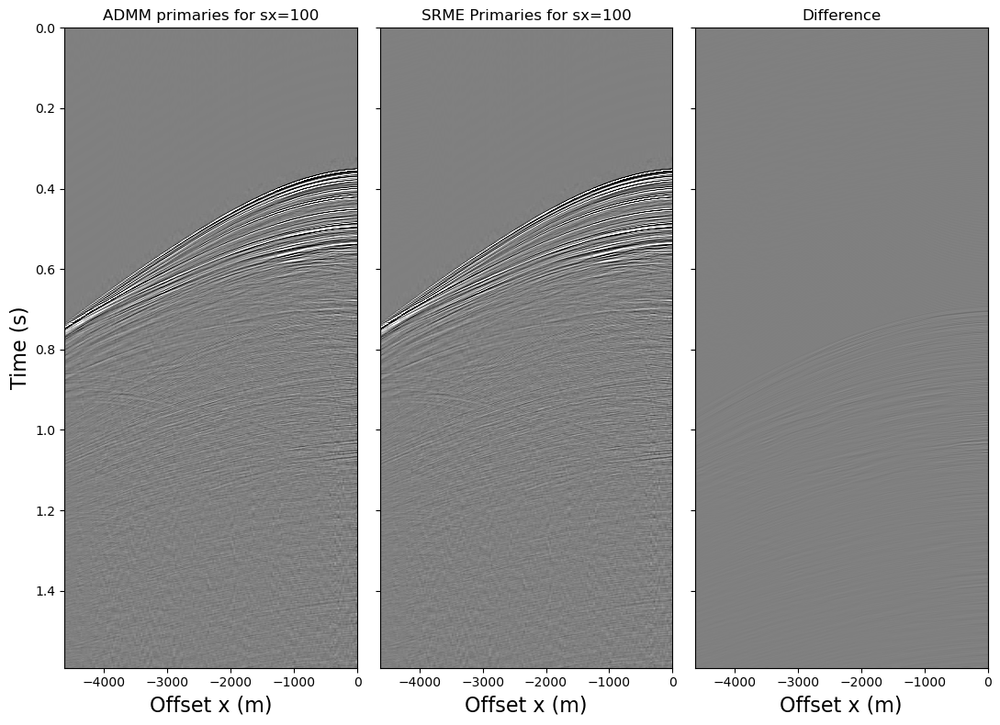

In [59]:
# Plotting parameters
vmax = 0.06 * np.amax(data)
vmin = -vmax
t0 = 0.0
t1 = t0 + (ns - 1) * dt
xmin = -4625
xmax = 0

fig, axs = plt.subplots(1, 3, figsize=(11,8),sharey=True)
axs[0].imshow(admm_primaries_test.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'ADMM primaries for sx=100',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)
axs[1].imshow(srme_primaries[173].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'SRME Primaries for sx=100',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=16)
axs[2].imshow((admm_primaries_test-srme_primaries[173]).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title(f'Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

plt.tight_layout()

In [ ]:
# Remove multiples from all shots 

admm_primaries = np.zeros_like(data)

for s in range(data.shape[0]):
       
    admm_primaries[s], _, _ = adasubtraction_parallel(data[s], multiples[s], solver='ADMM', nfilt=nfilt,
                                                                            nwin=nwin,
                                                                            cpu_num=15,
                                                                            solver_dict={'rho':rho,
                                                                                         'nouter':200,
                                                                                         'ninner':5,
                                                                                         'eps':eps})

In [ ]:
# Plot Common Channel Gathers of corrected primaries

vmax = 0.1 * np.amax(data)
vmin = -vmax
t0 = 0.0
t1 = t0 + (nt - 1) * dt
xmin = 0
xmax = ns * dx

fig, axs = plt.subplots(1, 3, figsize=(12,8),sharey=True)
axs[0].imshow(data[:, 173].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Total data for rx=173',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)
axs[1].imshow(admm_primaries[:, 173].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'ADMM primaries for rx=173',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=16)
axs[2].imshow(srme_primaries[:, 173].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title(f'SRME Primaries for rx=173',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

plt.tight_layout()

- SRME Primaries

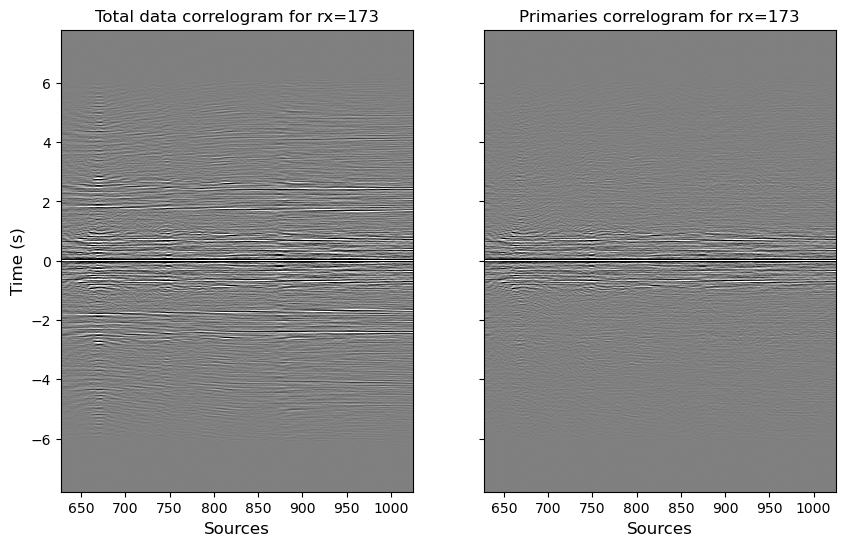

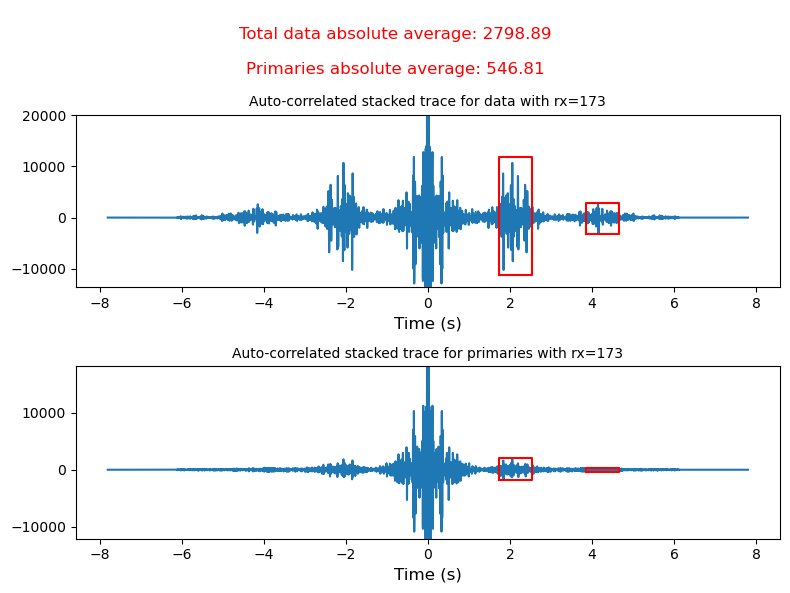

In [214]:
adasubtraction_qc(data, srme_primaries, gather_num=173)

- ADMM Primaries

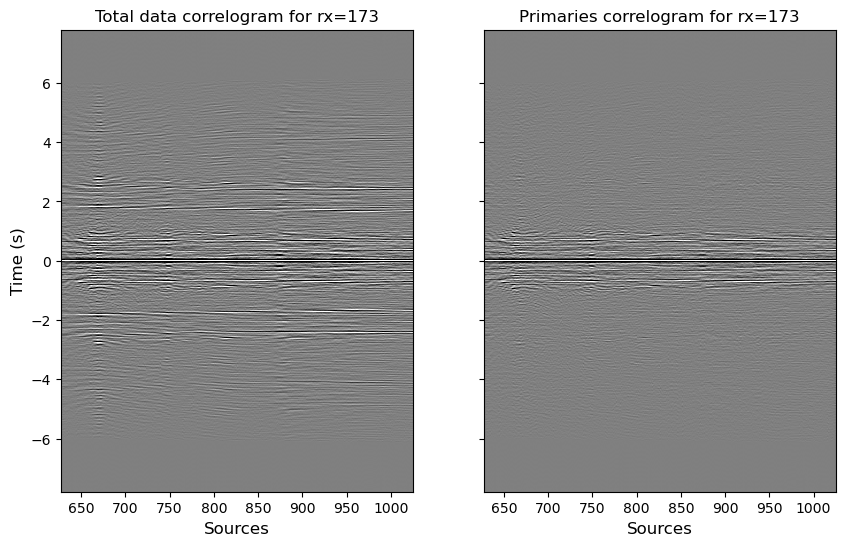

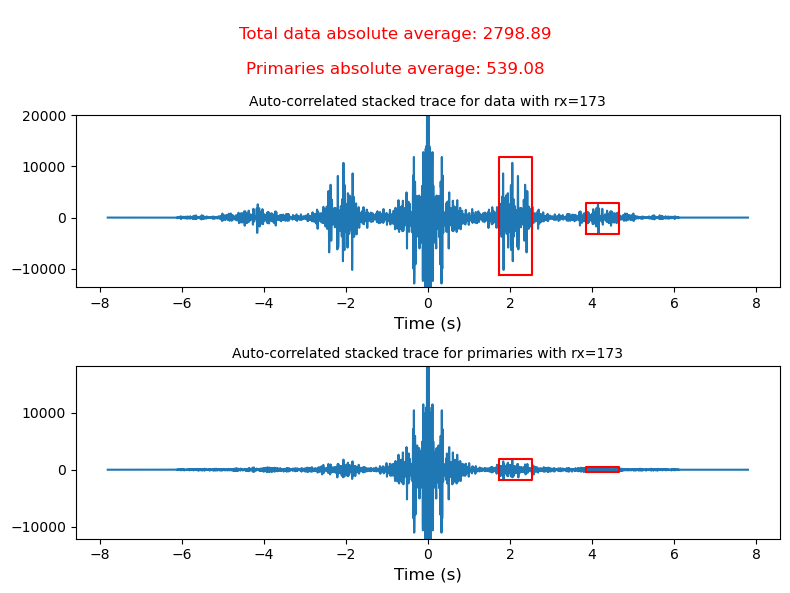

In [216]:
adasubtraction_qc(data, admm_primaries, gather_num=173)

### References

Guitton A. and Verschuur D. J. (2004). _Adaptive subtraction of multiples using the L1-norm_, Geophysical Prospecting, 2004, 52, 27–38.